In [1]:
import tensorflow as tf
import numpy as np
from tensorflow.keras import models
from tensorflow.keras import Model
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
import os
import tensorflow
import keras
import cv2
import face_recognition


Number of files =  6


img5.jpg


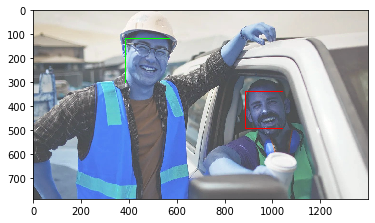

img4.jpg


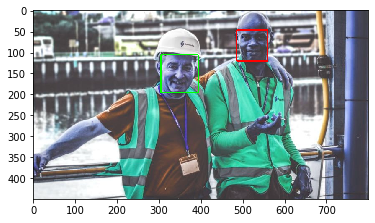

img6.jpg


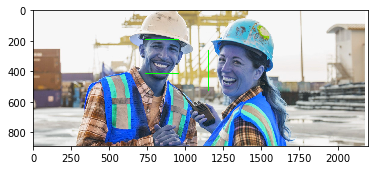

img3.jpg


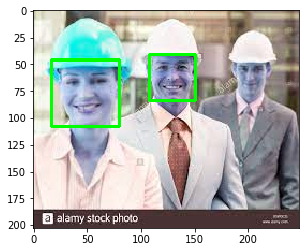

img2.jpg


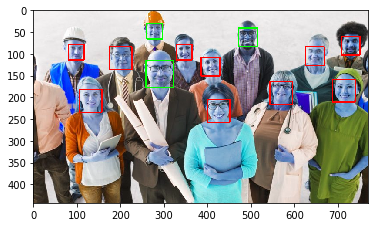

img1.jpg


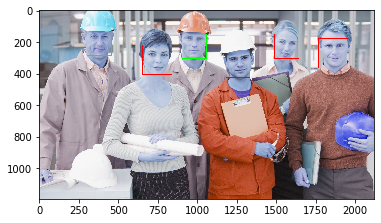

In [28]:
# read the saved model
def setup_hard_hat_detector():
    return load_model("res/vgg16_model/ninety2_percent_just_vgg16.h5")
hh_model=setup_hard_hat_detector()
out_location="raw_yolo_keras/end_end_test_out"
location="raw_yolo_keras/end_end_test"
#location where the images downloaded from the internet are placed

dim=(76,76)

head_taller_parameter=0.5
chin_taller_parameter=0.1
# parameters to extend the cropped faces

file_list=os.listdir(location)
for file in file_list:
    print(file)
    frame=cv2.imread(os.path.join(location,file))                
    (h, w) = frame.shape[:2]
    # Convert the image from BGR color (which OpenCV uses) to RGB color (which face_recognition uses)
    image = frame[:, :, ::-1]
    face_locations = face_recognition.face_locations(image)
    all_wearing_hats=True
    colors=[]
    for f_loc in face_locations:
        startY, endX, endY, startX=f_loc
        height=endY-startY
        #increase height by some %
        taller_head=int(head_taller_parameter*height)
        taller_chin=int(chin_taller_parameter*height)
        startY=max(0,startY-taller_head)
        endY=min(h,endY+taller_chin)
        cropped_image = frame[startY:endY, startX:endX]
        resized = cv2.resize(cropped_image, dim, interpolation = cv2.INTER_AREA)
        lst=np.array([resized])
        preds = hh_model.predict(lst)
        all_wearing_hats=all_wearing_hats&(preds[0][1]>0.5)
        if preds[0][1]>0.5:
            colors.append((0,255,0))
        else:
            colors.append((255,0,0))

    for i in range(len(face_locations)):
        startY, endX, endY, startX=face_locations[i]
        color=colors[i]
        cv2.rectangle(frame, (startX, startY), (endX, endY), color, 2)
    plt.imshow(frame)
    plt.imsave(os.path.join(out_location,file),frame)
    plt.show()




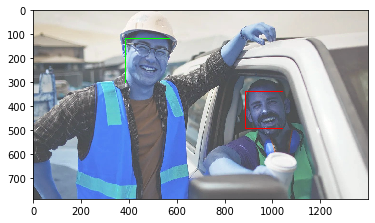

Hard hat status  False
Will have to save this


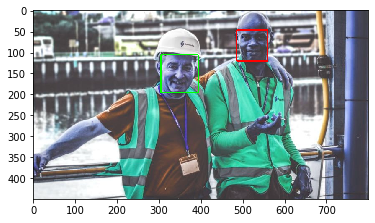

Hard hat status  False
Will have to save this


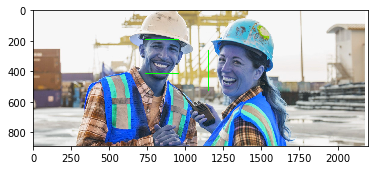

Hard hat status  True


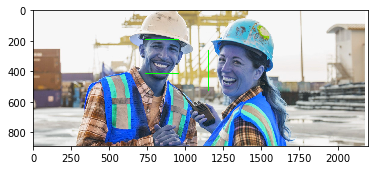

Hard hat status  True


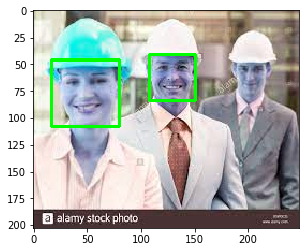

Hard hat status  True


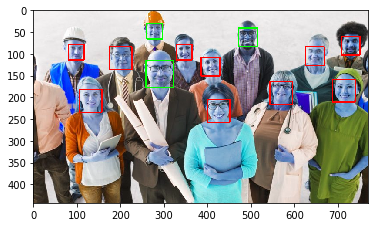

Hard hat status  False
Will have to save this


In [10]:
file_list=os.listdir(location)
i=0
j=0
for row_num in range(2):
    for col_num in range(3):
        file_num=row_num*2+col_num
        file=file_list[file_num]
        frame=cv2.imread(os.path.join(location,file))
        
        
    
        (h, w) = frame.shape[:2]

        # Convert the image from BGR color (which OpenCV uses) to RGB color (which face_recognition uses)
        image = frame[:, :, ::-1]
    #     image = face_recognition.load_image_file(os.path.join(location,file))
        face_locations = face_recognition.face_locations(image)
    #     print(face_locations)
        all_wearing_hats=True
        colors=[]
    #     print("Number of faces = ",len(face_locations))
        for f_loc in face_locations:
            startY, endX, endY, startX=f_loc
            height=endY-startY
            #increase height by 5%
            taller_head=int(0.5*height)
            taller_chin=int(0.1*height)
            startY=max(0,startY-taller_head)
            endY=min(h,endY+taller_chin)
            cropped_image = frame[startY:endY, startX:endX]
            resized = cv2.resize(cropped_image, dim, interpolation = cv2.INTER_AREA)
    #         plt.imshow(resized)
    #         plt.show()
            lst=np.array([resized])
            preds = hh_model.predict(lst)
            all_wearing_hats=all_wearing_hats&(preds[0][1]>0.5)
            if preds[0][1]>0.5:
                colors.append((0,255,0))
            else:
                colors.append((255,0,0))

        for i in range(len(face_locations)):
            startY, endX, endY, startX=face_locations[i]
            color=colors[i]
            cv2.rectangle(frame, (startX, startY), (endX, endY), color, 2)
        plt.imshow(frame)
        plt.show()
#         axs[row_num][col_num].imshow(frame)

        print("Hard hat status ",all_wearing_hats)        
        if not all_wearing_hats:
            print("Will have to save this")


    #     plt.show()

    #     x_start=0
    #     y_start=0

    #     frame,count,people_dict=detect_persons(frame,x_start,y_start,w,h,net,layer_names,output_layers,classes)            




    #     colors=[]
    #     for i in range(count):
    #         startX, startY, endX, endY=people_dict[i]["coords"]
    # #         endY=endY//3
    # #         startX=startX=10
    # #         endX=endX-10


    #         cropped_image = frame[startY:endY, startX:endX]

    #         print("Shape of cropped, resized image is ",resized.shape)
    #         plt.imshow(resized)
    #         plt.show()
    #         lst=np.array([resized])
    #         preds = hh_model.predict(lst)
    #         print(preds)
    #         COLOR = (0,255,0)
    #         if preds[0][0]<0.5:
    #             COLOR=(0,0,255)
    #         all_wearing_hats=all_wearing_hats&(preds[0][1]>0.5)
    # #         cv2.rectangle(frame, (startX, startY), (endX, endY), COLOR, 2)
    #     plt.imshow(frame)
    #     plt.show()


    #     print("Hard hat status ",all_wearing_hats)




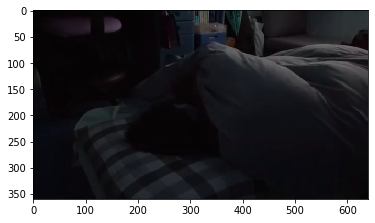

number of faces 0


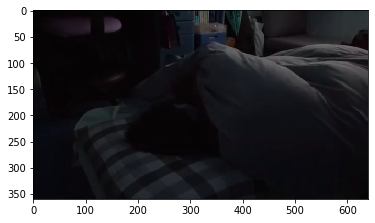

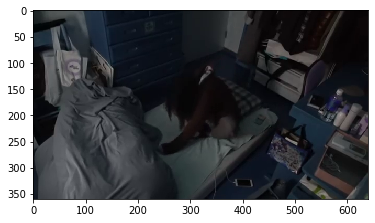

number of faces 0


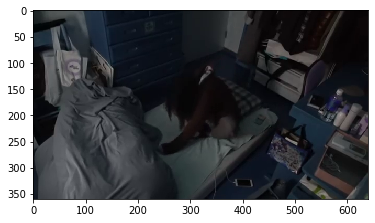

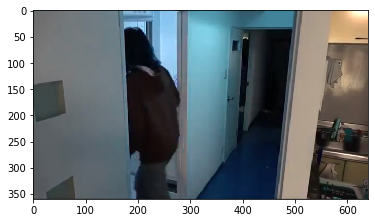

number of faces 0


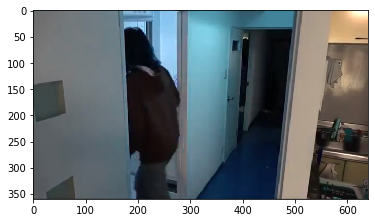

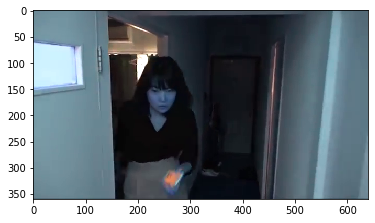

number of faces 1


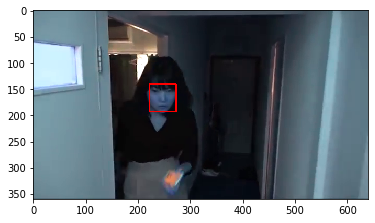

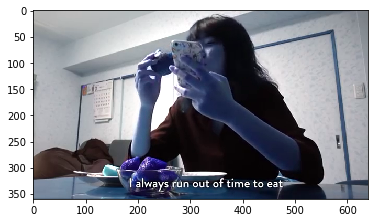

number of faces 0


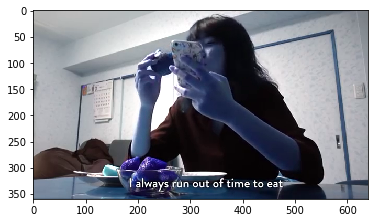

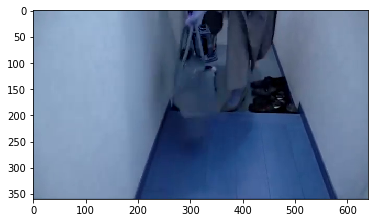

number of faces 0


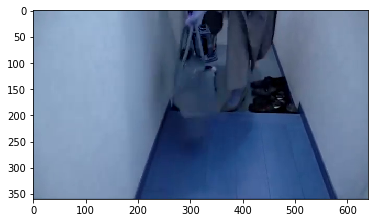

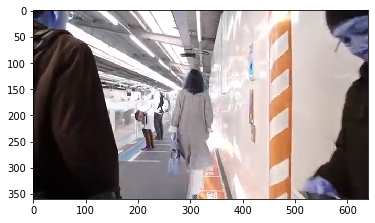

number of faces 0


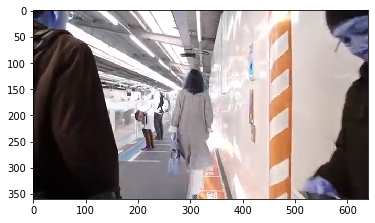

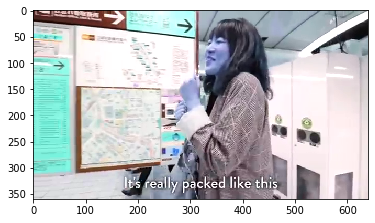

number of faces 1


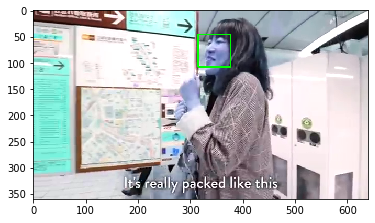

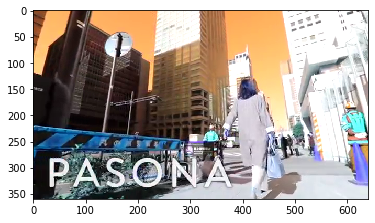

number of faces 0


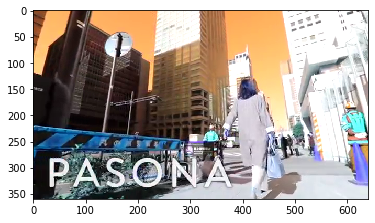

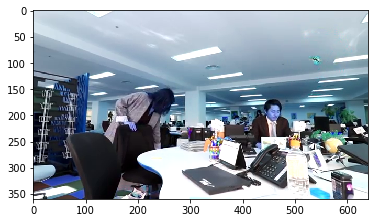

number of faces 0


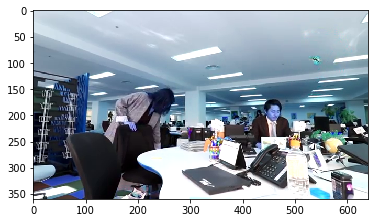

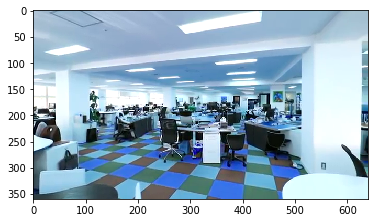

number of faces 0


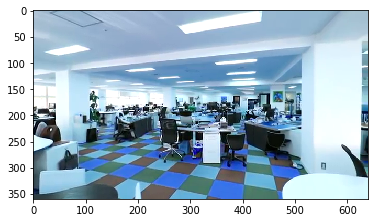

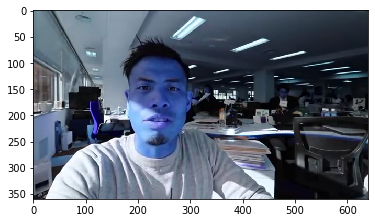

number of faces 1


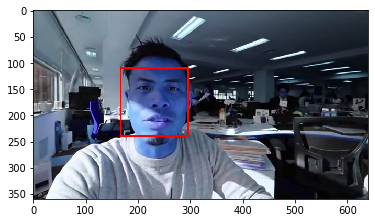

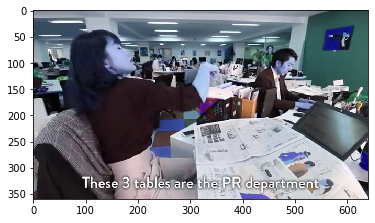

number of faces 0


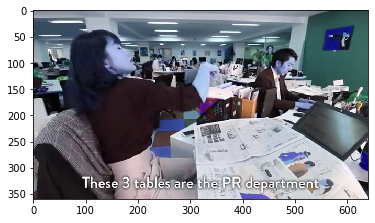

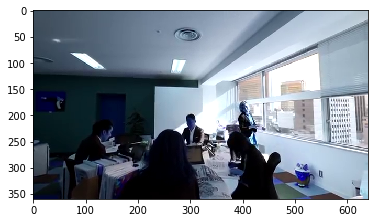

number of faces 0


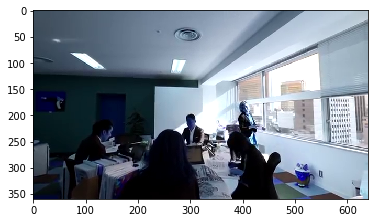

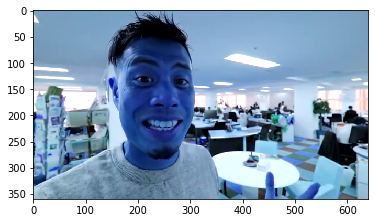

number of faces 1


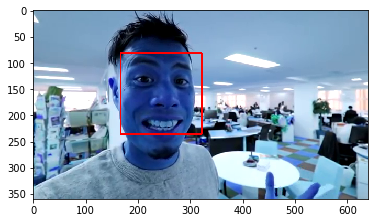

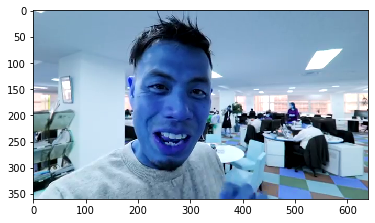

number of faces 1


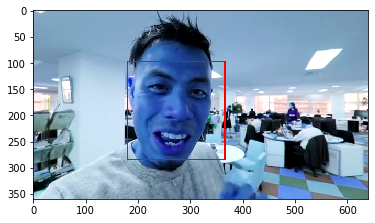

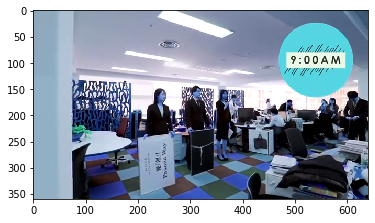

number of faces 0


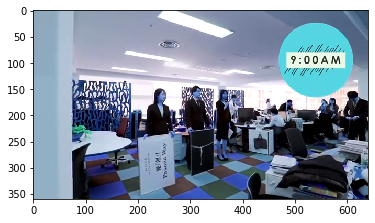

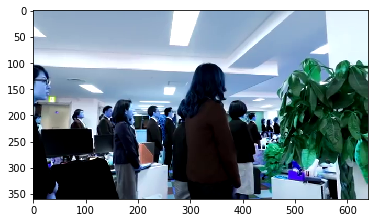

number of faces 0


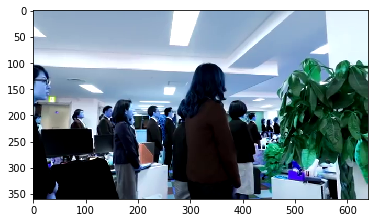

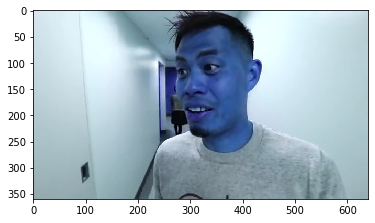

number of faces 1


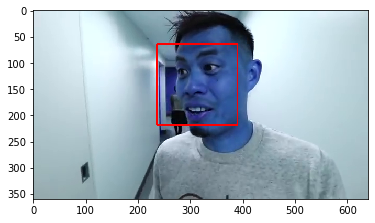

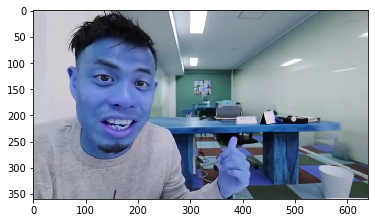

number of faces 1


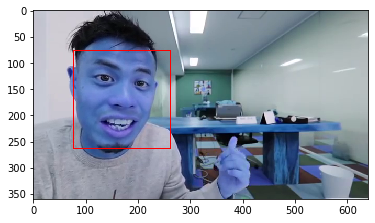

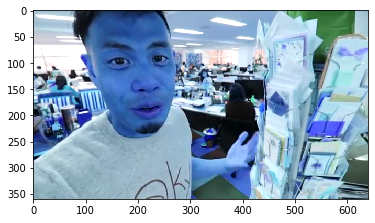

number of faces 0


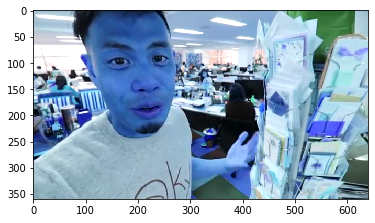

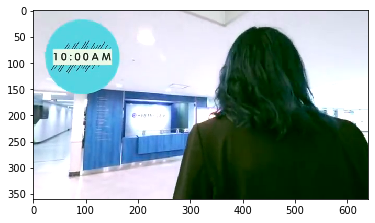

number of faces 0


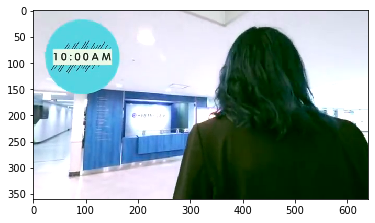

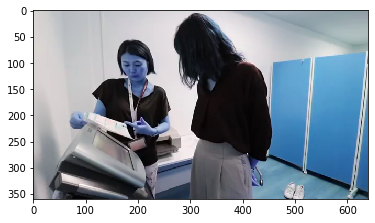

number of faces 1


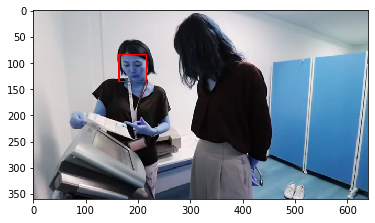

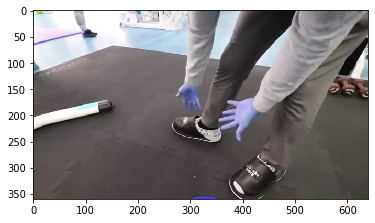

number of faces 0


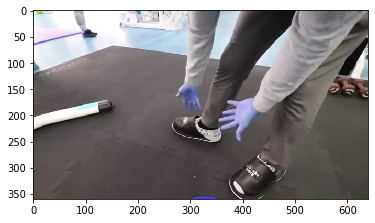

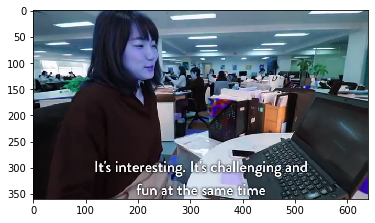

number of faces 1


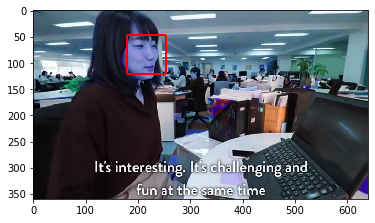

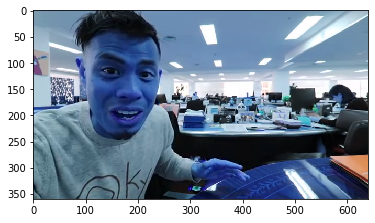

number of faces 1


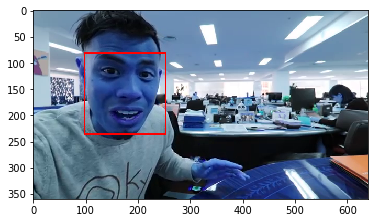

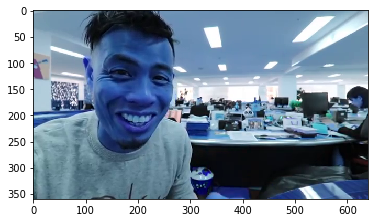

number of faces 1


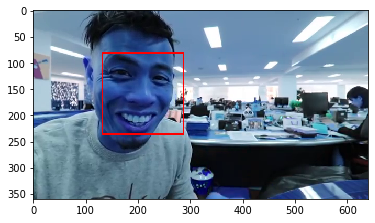

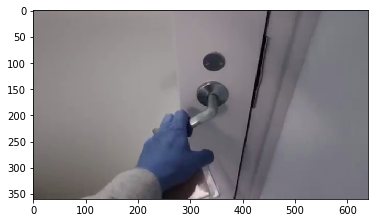

number of faces 0


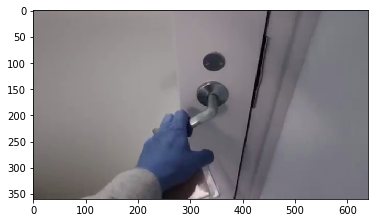

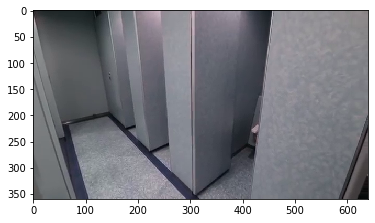

number of faces 0


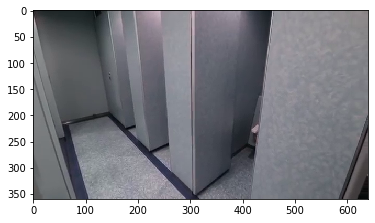

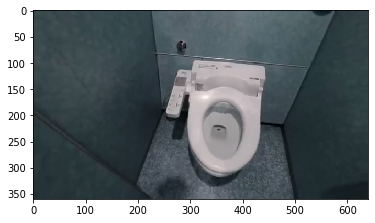

number of faces 0


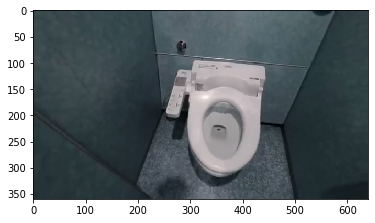

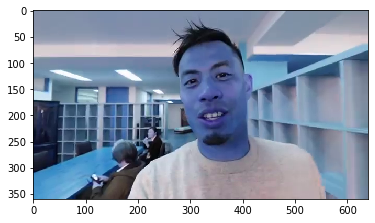

number of faces 1


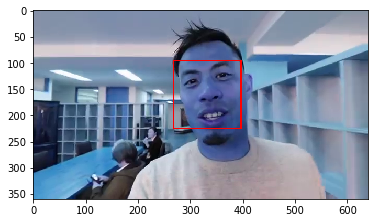

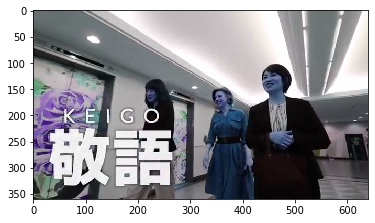

number of faces 0


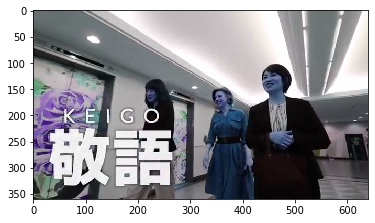

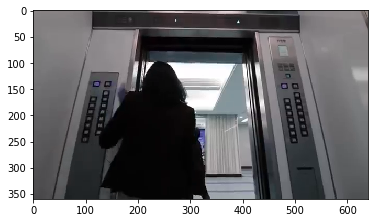

number of faces 0


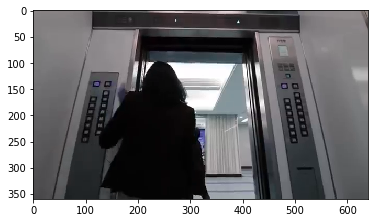

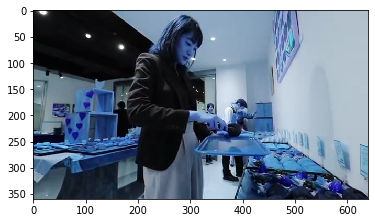

number of faces 0


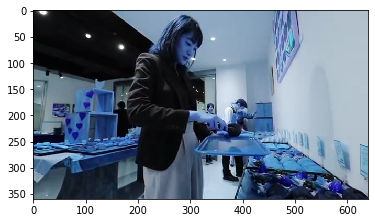

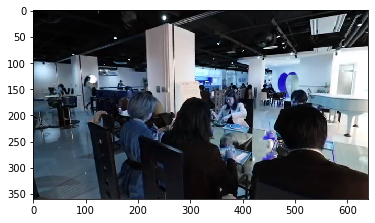

number of faces 0


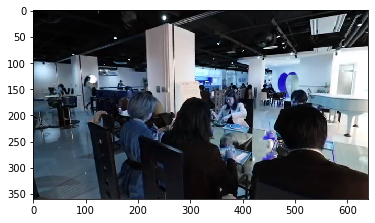

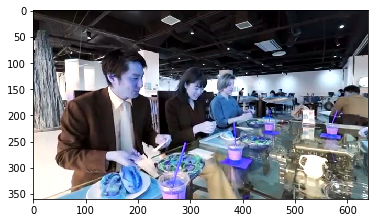

number of faces 0


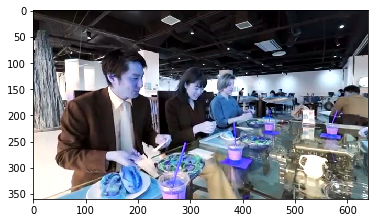

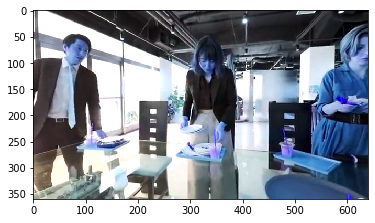

number of faces 0


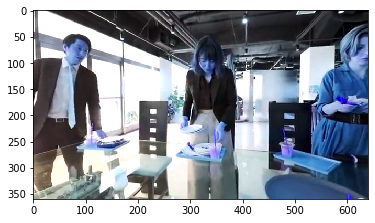

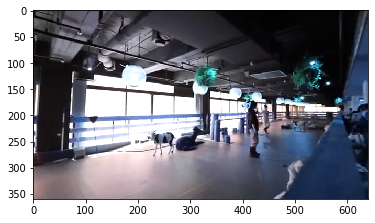

number of faces 0


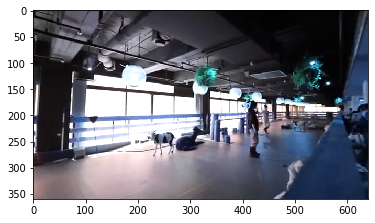

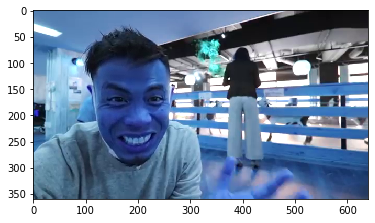

number of faces 1


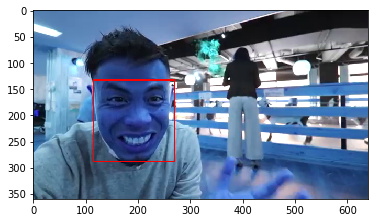

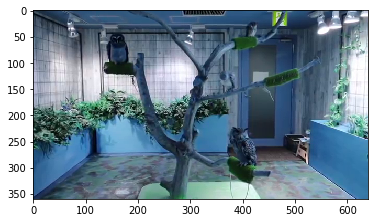

number of faces 0


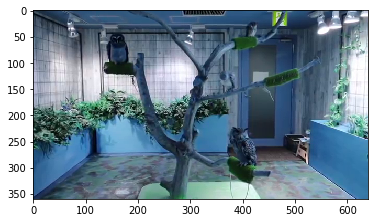

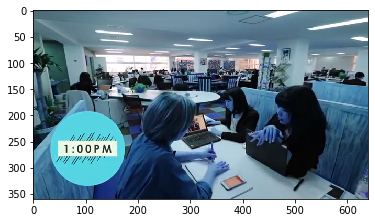

number of faces 0


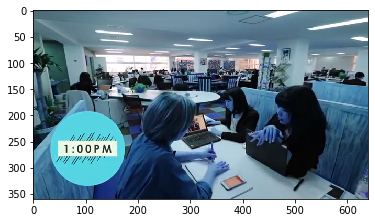

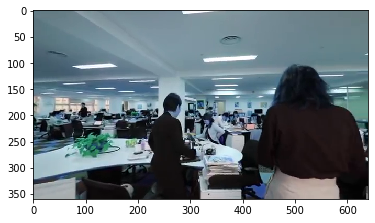

number of faces 0


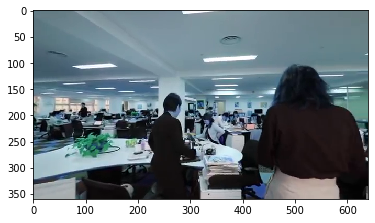

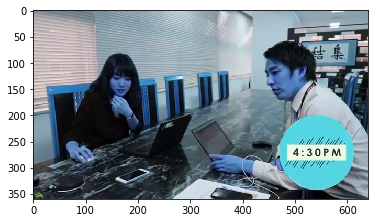

number of faces 1


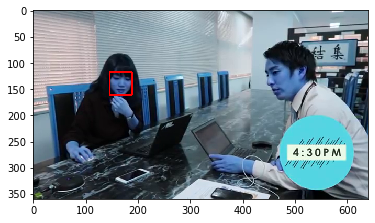

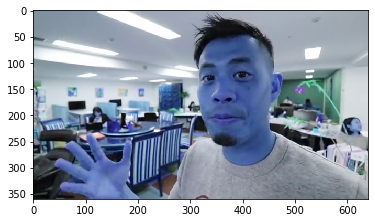

number of faces 1


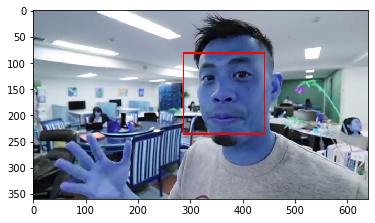

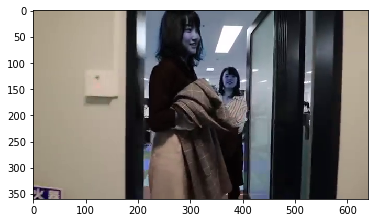

number of faces 0


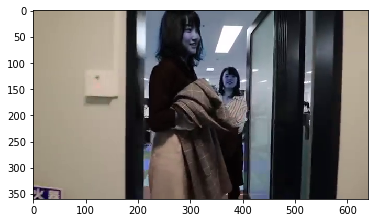

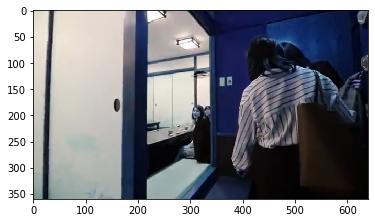

number of faces 0


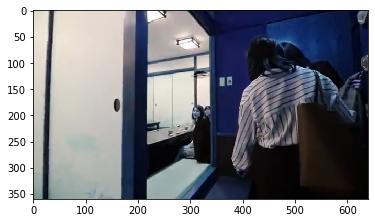

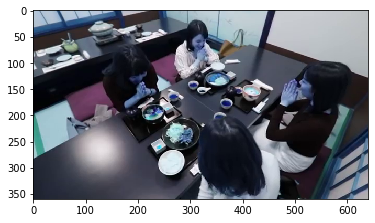

number of faces 0


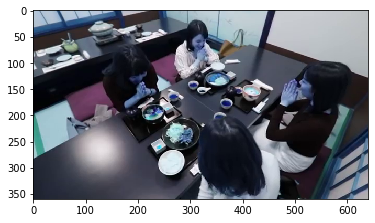

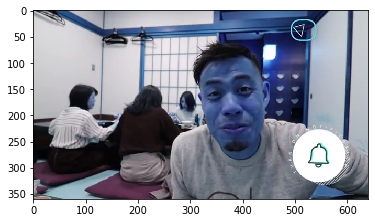

number of faces 1


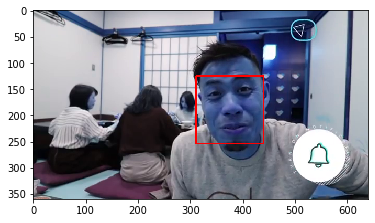

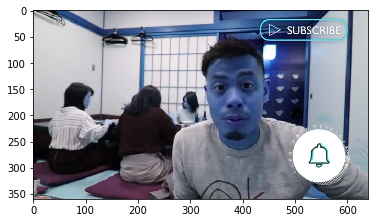

number of faces 1


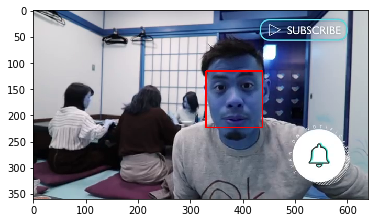

TypeError: Image data of dtype object cannot be converted to float

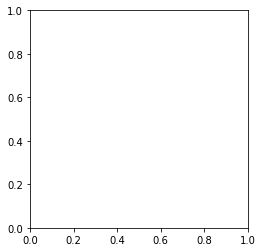

In [12]:
dim=(76,76)
cap = cv2.VideoCapture("videoplayback.mp4")
count=1
while(cap.isOpened()):
    ret,frame = cap.read()
    count+=1
    if count%500==0:
        plt.imshow(frame)
        plt.show()
        (h, w) = frame.shape[:2]
        # Convert the image from BGR color (which OpenCV uses) to RGB color (which face_recognition uses)
        image = frame[:, :, ::-1]
        face_locations = face_recognition.face_locations(image)
        print("number of faces",len(face_locations))
            
        all_wearing_hats=True
        colors=[]
    #     print("Number of faces = ",len(face_locations))
        for f_loc in face_locations:
            startY, endX, endY, startX=f_loc
            height=endY-startY
            #increase height by 5%
            taller_head=int(0.5*height)
            taller_chin=int(0.1*height)
            startY=max(0,startY-taller_head)
            endY=min(h,endY+taller_chin)
            cropped_image = frame[startY:endY, startX:endX]
            resized = cv2.resize(cropped_image, dim, interpolation = cv2.INTER_AREA)
    #         plt.imshow(resized)
    #         plt.show()
            lst=np.array([resized])
            preds = hh_model.predict(lst)
            all_wearing_hats=all_wearing_hats&(preds[0][1]>0.5)
            if preds[0][1]>0.5:
                colors.append((0,255,0))
            else:
                colors.append((255,0,0))

        for i in range(len(face_locations)):
            startY, endX, endY, startX=face_locations[i]
            color=colors[i]
            cv2.rectangle(frame, (startX, startY), (endX, endY), color, 2)
        plt.imshow(frame)
        plt.show()
    

In [ ]:
location="raw_yolo_keras/end_end_test"
dim=(76,76)
for file in os.listdir(location):
    frame=cv2.imread(os.path.join(location,file))
    (h, w) = frame.shape[:2]
    
    # Convert the image from BGR color (which OpenCV uses) to RGB color (which face_recognition uses)
    image = frame[:, :, ::-1]
#     image = face_recognition.load_image_file(os.path.join(location,file))
    face_locations = face_recognition.face_locations(image)
#     print(face_locations)
    all_wearing_hats=True
    colors=[]
#     print("Number of faces = ",len(face_locations))
    for f_loc in face_locations:
        startY, endX, endY, startX=f_loc
        height=endY-startY
        #increase height by 5%
        taller_head=int(0.5*height)
        taller_chin=int(0.1*height)
        startY=max(0,startY-taller_head)
        endY=min(h,endY+taller_chin)
        cropped_image = frame[startY:endY, startX:endX]
        resized = cv2.resize(cropped_image, dim, interpolation = cv2.INTER_AREA)
#         plt.imshow(resized)
#         plt.show()
        lst=np.array([resized])
        preds = hh_model.predict(lst)
        all_wearing_hats=all_wearing_hats&(preds[0][1]>0.5)
        if preds[0][1]>0.5:
            colors.append((0,255,0))
        else:
            colors.append((255,0,0))

    for i in range(len(face_locations)):
        startY, endX, endY, startX=face_locations[i]
        color=colors[i]
        cv2.rectangle(frame, (startX, startY), (endX, endY), color, 2)
    plt.imshow(frame)
    plt.show()

    print("Hard hat status ",all_wearing_hats)        
    if not all_wearing_hats:
        print("Will have to save this")
        
    